В качестве датасета был выбран https://huggingface.co/datasets/lj_speech

При обучении модели использовался следующий гайд: https://huggingface.co/docs/transformers/main/tasks/text-to-speech

# **Описание датасета**:


- **Датасет "lj_speech"** представляет собой общедоступный набор аудиозаписей, состоящий из 13 100 коротких аудиофрагментов, записанных одним диктором, который читает отрывки из 7 научно-популярных книг на английском языке. Каждому фрагменту аудио прилагается текстовая транскрипция. Длина фрагментов варьируется от 1 до 10 секунд, общая продолжительность составляет примерно 24 часа.

- Тексты были опубликованы между 1884 и 1964 годами и находятся в общественном достоянии. Аудиозаписи были сделаны в 2016-2017 годах проектом LibriVox и также находятся в общественном достоянии.

**Поддерживаемые задачи:**

- automatic-speech-recognition (ASR): Модель ASR получает аудиофайл и должна провести транскрипцию аудиофайла в письменный текст. Основная метрика оценки ASR - это коэффициент ошибок слов (WER).
- text-to-speech (TTS), text-to-audio: Модель TTS получает письменный текст на естественном языке и генерирует аудиофайл речи. Разумной метрикой оценки является средний оценочный балл (MOS) качества звука.


**Язык:** транскрипции и аудиофайлы на английском языке.


**Cтруктура датасета:**

1. Экземпляры данных: Каждая запись содержит путь к аудиофайлу (.wav) и его транскрипцию в виде текста. Также предоставляется нормализованная версия текста.

**Поля данных:**
2. id: Уникальный идентификатор образца данных.
3. file: Путь к загруженному аудиофайлу в формате .wav.
4. audio: Словарь, содержащий путь к аудиофайлу, декодированный массив аудио и частоту дискретизации.
5. text: Транскрипция аудиофайла.
normalized_text: Транскрипция с развёрнутыми числами, порядковыми числительными и валютой.


**Источник данных:**
данные включают отрывки из следующих работ:

- Morris, William, et al. Arts and Crafts Essays. 1893.
- Griffiths, Arthur. The Chronicles of Newgate, Vol. 2. 1884.
- Roosevelt, Franklin D. The Fireside Chats of Franklin Delano Roosevelt. 1933-42.
- Harland, Marion. Marion Harland's Cookery for Beginners. 1893.
- Rolt-Wheeler, Francis. The Science - History of the Universe, Vol. 5: Biology. 1910.
- Banks, Edgar J. The Seven Wonders of the Ancient World. 1916.
- President's Commission on the Assassination of President Kennedy. Report of the President's Commission on the Assassination of President Kennedy. 1964.

**Нормализация:**

- Нормализованный текст включает цифры, порядковые номера и денежные единицы, расширенные до полных слов (UTF-8).
- 19 транскрипций содержат не ASCII-символы (например, LJ016-0257 содержит "raison d'être").
- В тексте встречаются следующие сокращения, которые могут быть развёрнуты:
Mr. - Mister,
Mrs. - Misess (*)
Dr. - Doctor
и другие.

**Процесс аннотации:**
соответствие текста аудиофайлу было проверено вручную, и была проведена проверка качества для точного соответствия слов в тексте с произнесенными в аудио.

**Разделение данных:** датасет не предварительно разделен. Ниже приведена некоторая статистика (указана сразу в описании датасета):
- Всего фрагментов: 13 100
- Всего слов: 225 715
- Всего символов: 1 308 678
- Общая длительность: 23:55:17
- Средняя длительность фрагмента: 6.57 секунд
- Минимальная длительность фрагмента: 1.11 секунды
- Максимальная длительность фрагмента: 10.10 секунд
- Среднее количество слов в фрагменте: 17.23
- Уникальных слов: 13 821

# **Область применения системы синтеза и главная задача**

**Область применения синтеза речи:**
в контексте данного исследования область применения имеет довольно широкий спектр.

**Основная задача** заключается в исследовании работы системы синтеза речи на датасете, содержащем специализированную лексику или терминологию, уникальную для определенной области знаний или тематики.
В дальнейшем данном исследование может представлять собой ценный материал для развития и улучшения голосовых систем, аудиокниг и другие голосовых приложени.

## Установка необходимых зависисмостей

In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 507.1/507.1 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.1 MB/s eta 0:00:00


In [ ]:
!pip install transformers[sentencepiece]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 6.3 MB/s eta 0:00:00


In [ ]:
!pip install transformers[torch]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 2.6 MB/s eta 0:00:00


In [ ]:
!pip install speechbrain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 630.6/630.6 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.4/116.4 kB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 526.7/526.7 kB 28.0 MB/s eta 0:00:00


## Загрузка датасета

In [ ]:
import os
import torch
from datasets import load_dataset, Audio
from speechbrain.pretrained import EncoderClassifier

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
dataset = load_dataset('lj_speech', split='train')

Generating train split: 0 examples [00:00, ? examples/s]

In [ ]:
len(dataset)

13100

In [ ]:
dataset = dataset.cast_column("audio", Audio(sampling_rate=16000))

In [ ]:
first_sample = dataset[0]

# **Исследование спектрограмм**

Проведем некоторое исследование спектрограмм отдельных фрагментов:


In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

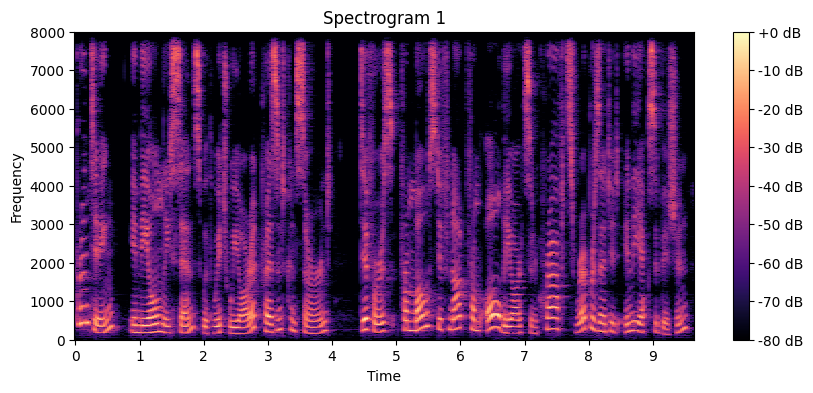

In [ ]:
audio_array = first_sample['audio']['array']
sampling_rate = first_sample['audio']['sampling_rate']

spectrogram = librosa.amplitude_to_db(np.abs(librosa.stft(audio_array)), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(spectrogram, sr=sampling_rate, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram 1')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.show()

In [ ]:
sample_12000 = dataset[12000]

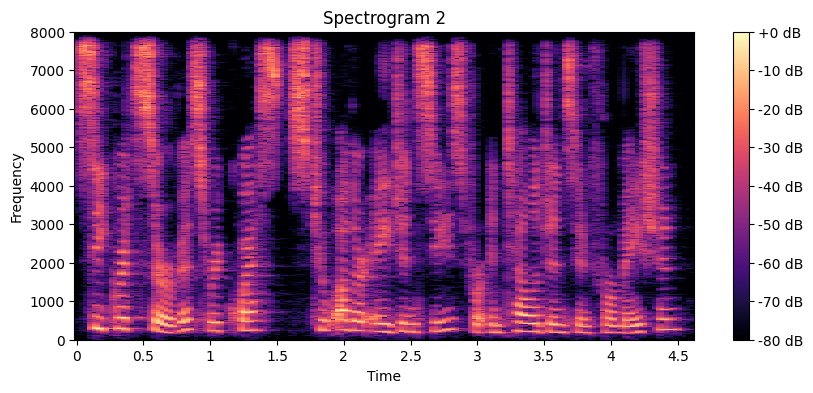

In [ ]:
audio_array = sample_12000['audio']['array']
sampling_rate = sample_12000['audio']['sampling_rate']

spectrogram = librosa.amplitude_to_db(np.abs(librosa.stft(audio_array)), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(spectrogram, sr=sampling_rate, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram 2')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.show()

In [ ]:
sample_5000 = dataset[5000]

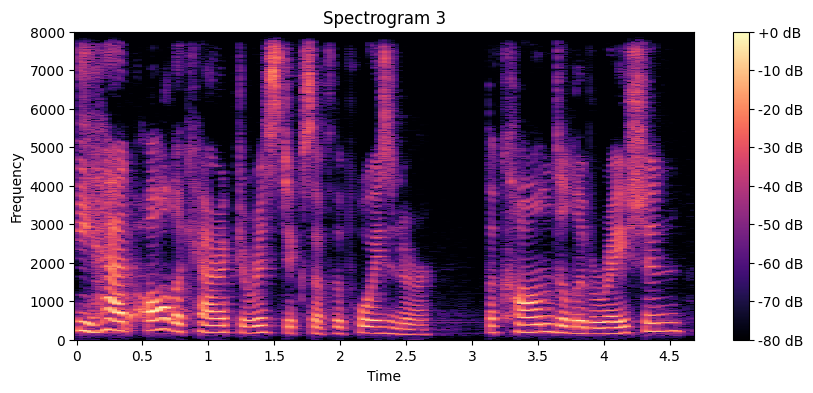

In [ ]:
audio_array = sample_5000['audio']['array']
sampling_rate = sample_5000['audio']['sampling_rate']

spectrogram = librosa.amplitude_to_db(np.abs(librosa.stft(audio_array)), ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(spectrogram, sr=sampling_rate, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram 3')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.show()

Вывод: данные имеют приблизительно одинаковое распределение частот, показывают схожую интенсивность.

# **Подготовка датасета**

In [ ]:
spk_model_name = "speechbrain/spkrec-xvect-voxceleb"

device = "cuda" if torch.cuda.is_available() else "cpu"
speaker_model = EncoderClassifier.from_hparams(
    source=spk_model_name,
    run_opts={"device": device},
    savedir=os.path.join("/tmp", spk_model_name),
)


def create_speaker_embedding(waveform):
    with torch.no_grad():
        speaker_embeddings = speaker_model.encode_batch(torch.tensor(waveform))
        speaker_embeddings = torch.nn.functional.normalize(speaker_embeddings, dim=2)
        speaker_embeddings = speaker_embeddings.squeeze().cpu().numpy()
    return speaker_embeddings

hyperparams.yaml:   0%|          | 0.00/2.04k [00:00<?, ?B/s]

embedding_model.ckpt:   0%|          | 0.00/16.9M [00:00<?, ?B/s]

mean_var_norm_emb.ckpt:   0%|          | 0.00/3.20k [00:00<?, ?B/s]

classifier.ckpt:   0%|          | 0.00/15.9M [00:00<?, ?B/s]

label_encoder.txt:   0%|          | 0.00/129k [00:00<?, ?B/s]

In [ ]:
from transformers import SpeechT5Processor
processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_tts")

preprocessor_config.json:   0%|          | 0.00/433 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/232 [00:00<?, ?B/s]

spm_char.model:   0%|          | 0.00/238k [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/40.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/234 [00:00<?, ?B/s]

In [ ]:
def prepare_dataset(example):
    audio = example["audio"]

    example = processor(
        text=example["normalized_text"],
        audio_target=audio["array"],
        sampling_rate=audio["sampling_rate"],
        return_attention_mask=False,
    )

    # strip off the batch dimension
    example["labels"] = example["labels"][0]

    # use SpeechBrain to obtain x-vector
    example["speaker_embeddings"] = create_speaker_embedding(audio["array"])

    return example

In [ ]:
processed_example = prepare_dataset(dataset[0])

In [ ]:
list(processed_example.keys())

['input_ids', 'labels', 'speaker_embeddings']

In [ ]:
dataset = dataset.map(prepare_dataset, remove_columns=dataset.column_names)

Map:   0%|          | 0/13100 [00:00<?, ? examples/s]

In [ ]:
dataset = dataset.train_test_split(test_size=0.05)

## Загрузка предобученной модели

In [ ]:
tokenizer = processor.tokenizer

In [ ]:
from transformers import SpeechT5ForTextToSpeech

model = SpeechT5ForTextToSpeech.from_pretrained("microsoft/speecht5_tts")

config.json:   0%|          | 0.00/2.06k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/585M [00:00<?, ?B/s]

In [ ]:
model.config.use_cache = False

## Подготовка к тренировке

In [ ]:
from dataclasses import dataclass
from typing import Any, Dict, List, Union

In [ ]:
@dataclass
class TTSDataCollatorWithPadding:
    processor: Any

    def __call__(self, features: List[Dict[str, Union[List[int], torch.Tensor]]]) -> Dict[str, torch.Tensor]:
        input_ids = [{"input_ids": feature["input_ids"]} for feature in features]
        label_features = [{"input_values": feature["labels"]} for feature in features]
        speaker_features = [feature["speaker_embeddings"] for feature in features]

        # collate the inputs and targets into a batch
        batch = processor.pad(input_ids=input_ids, labels=label_features, return_tensors="pt")

        # replace padding with -100 to ignore loss correctly
        batch["labels"] = batch["labels"].masked_fill(batch.decoder_attention_mask.unsqueeze(-1).ne(1), -100)

        # not used during fine-tuning
        del batch["decoder_attention_mask"]

        # round down target lengths to multiple of reduction factor
        if model.config.reduction_factor > 1:
            target_lengths = torch.tensor([len(feature["input_values"]) for feature in label_features])
            target_lengths = target_lengths.new(
                [length - length % model.config.reduction_factor for length in target_lengths]
            )
            max_length = max(target_lengths)
            batch["labels"] = batch["labels"][:, :max_length]

        # also add in the speaker embeddings
        batch["speaker_embeddings"] = torch.tensor(speaker_features)

        return batch

In [ ]:
data_collator = TTSDataCollatorWithPadding(processor=processor)

In [ ]:
from transformers import Seq2SeqTrainingArguments

In [ ]:
training_args = Seq2SeqTrainingArguments(
    output_dir="speecht5_finetuned",  # change to a repo name of your choice
    per_device_train_batch_size=4,
    gradient_accumulation_steps=8,
    learning_rate=1e-5,
    warmup_steps=500,
    max_steps=4000,
    gradient_checkpointing=True,
    fp16=True,
    evaluation_strategy="steps",
    per_device_eval_batch_size=2,
    save_steps=1000,
    eval_steps=1000,
    logging_steps=25,
    load_best_model_at_end=True,
    greater_is_better=False,
    label_names=["labels"],
)

In [ ]:
from transformers import Seq2SeqTrainer

In [ ]:
trainer = Seq2SeqTrainer(
    args=training_args,
    model=model,
    train_dataset=dataset["train"],
    eval_dataset=dataset["test"],
    data_collator=data_collator,
    tokenizer=processor,
)

## Тренировка

In [ ]:
trainer.train()

/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(


Step,Training Loss,Validation Loss
1000,0.430400,0.386469
2000,0.419300,0.379796
3000,0.414000,0.376453


/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
processor.save_pretrained('/content/drive/MyDrive/speecht5_finetuned')

In [ ]:
model.save_pretrained('/content/drive/MyDrive/speecht5_finetuned')

## Тест зафайнтюненной модели

In [ ]:
import gdown

url = "https://drive.google.com/drive/folders/1oM-4RTIMtw_3jYxtGpUQwbB6OWIKuG4k?usp=sharing"
gdown.download_folder(url, quiet=True, use_cookies=False)

['/content/speecht5_finetuned/added_tokens.json',
 '/content/speecht5_finetuned/config.json',
 '/content/speecht5_finetuned/generation_config.json',
 '/content/speecht5_finetuned/model.safetensors',
 '/content/speecht5_finetuned/preprocessor_config.json',
 '/content/speecht5_finetuned/special_tokens_map.json',
 '/content/speecht5_finetuned/spm_char.model',
 '/content/speecht5_finetuned/tokenizer_config.json']

In [ ]:
model = SpeechT5ForTextToSpeech.from_pretrained('/content/speecht5_finetuned')
model.to(device)

SpeechT5ForTextToSpeech(
  (speecht5): SpeechT5Model(
    (encoder): SpeechT5EncoderWithTextPrenet(
      (prenet): SpeechT5TextEncoderPrenet(
        (embed_tokens): Embedding(81, 768, padding_idx=1)
        (encode_positions): SpeechT5ScaledPositionalEncoding(
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
      (wrapped_encoder): SpeechT5Encoder(
        (layer_norm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (layers): ModuleList(
          (0-11): 12 x SpeechT5EncoderLayer(
            (attention): SpeechT5Attention(
              (k_proj): Linear(in_features=768, out_features=768, bias=True)
              (v_proj): Linear(in_features=768, out_features=768, bias=True)
              (q_proj): Linear(in_features=768, out_features=768, bias=True)
              (out_proj): Linear(in_features=768, out_features=768, bias=True)
            )
            (dropout): Dropout(p=0.1, inplace=False)
     

In [ ]:
processor = SpeechT5Processor.from_pretrained('/content/speecht5_finetuned')

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
from transformers import SpeechT5HifiGan

In [ ]:
vocoder = SpeechT5HifiGan.from_pretrained('microsoft/speecht5_hifigan')
vocoder.to(device)

config.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/50.7M [00:00<?, ?B/s]

SpeechT5HifiGan(
  (conv_pre): Conv1d(80, 512, kernel_size=(7,), stride=(1,), padding=(3,))
  (upsampler): ModuleList(
    (0): ConvTranspose1d(512, 256, kernel_size=(8,), stride=(4,), padding=(2,))
    (1): ConvTranspose1d(256, 128, kernel_size=(8,), stride=(4,), padding=(2,))
    (2): ConvTranspose1d(128, 64, kernel_size=(8,), stride=(4,), padding=(2,))
    (3): ConvTranspose1d(64, 32, kernel_size=(8,), stride=(4,), padding=(2,))
  )
  (resblocks): ModuleList(
    (0): HifiGanResidualBlock(
      (convs1): ModuleList(
        (0): Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(1,))
        (1): Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(3,), dilation=(3,))
        (2): Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(5,), dilation=(5,))
      )
      (convs2): ModuleList(
        (0-2): 3 x Conv1d(256, 256, kernel_size=(3,), stride=(1,), padding=(1,))
      )
    )
    (1): HifiGanResidualBlock(
      (convs1): ModuleList(
        (0): Conv1d(256, 256,

In [ ]:
example = dataset["test"][304]
speaker_embeddings = torch.tensor(example["speaker_embeddings"]).unsqueeze(0)

# **Проверка работы модели на данных из интернета**

В сети Интернет были найдены текстовые ресурсы разных дискурсов и стилей для проверки корректности работы модели на новых данных. Для проверки мы взяли:
* Аннотацию из научной статьи (сфера NLP)
* Вырезку из художественного произведения (романа)
* Абзац о философе/психоаналитке Жаке Лакане из онлайн-энциклопедии
* Цитаты персонажей из GTA: San Andreas (имитация речи жителей гетто)
* Цитата из видео на платформе Youtube, связанная с музыкальной тематикой (взята из автоматически сгенерированных субтитров)
* Различные комментарии под видео в Youtube
* Цитата из текста песни, взятая с Genius
* Самостоятельно сгенерированные короткие комментарии

In [ ]:
# {text: source}

texts = {
    'Speech is one of the oldest and most natural means of information exchange between human. Over the years, Attempts have been made to develop vocally interactive computers to realise voice/speech synthesis. Obviously such an interface would yield great benefits.': 'https://www.researchgate.net/publication/319406874_Text_-_To_-_Speech_Synthesis_TTS',
    'Next day They drove downtown to buy things needed for the camp: any wearable purchase worked wonders with Lo. She seemed her usual sarcastic self at dinner. Immediately afterwards, she went up to her room to plunge into the comic books acquired for rainy days at Camp Q,. (they were so thoroughly sampled by Thursday that she left thembehind).': 'https://archive.org/details/LolitaVladimirNabokov/page/n62/mode/1up',
    'For Jacques Lacan, it is only when the child accedes to castration and the Law of the father, that s/he becomes fully competent as a language-speaker within his/her given social collective. By contrast, individuals suffering from psychosis, Lacan stresses (in line with a vast wealth of psychological research), are prone to characteristic linguistic dysfunctions and inabilities.': 'https://iep.utm.edu/lacweb/#SH3a',
    "Big Smoke: I'll have two number nines, a number nine large, a number six with extra dip, a number seven, two number fourty fives, one with cheese, and a large soda.": 'https://www.quotes.net/mquote/1187052',
    'Carl Johnson: Grove Street. Home. At least it used to be until I f***ed everything up.': 'https://www.quotes.net/mquote/1187052',
    "There was no way to see the lot because a player can not fly a plane so as to see the view from the sky until someone discovered a glitch (not a cheat). This is a fun way to see areas. Now, being that you can get into the sectioned area by the alley, you can see some wood planks that enable you to drive or walk our so, my question is, is there a way that I overlooked to get into the lot without the glitch?": 'https://www.youtube.com/watch?v=Qbs0RvC04Xw',
    "This band came into my life about two weeks before the world was transformed by Nirvana. It insulated me in a Mr Bungle force field & convinced to try to play music, saving up money to buy a bass. I figured if I suck I can still mash metal with other stuff & still create stuff better than alot of what people listened to. Most people I loaned the MB album to listened and said it was too weird.": 'https://www.youtube.com/watch?v=I-LEAM8HTjE',
    "despite Mr Bungle only having three real albums in 38 years of existence and their music being well incredibly bizarre and deliberately inaccessible somehow they've quietly become one of the most influential bands in the last 30 years of rock and metal with mini bands like Korn and Dillinger Escape Plan who are all legends in their own right giving the band gredit as a massive influence": 'https://www.youtube.com/watch?v=I-LEAM8HTjE',
    "Writhing and embraced. Retribution, soul eclipse turns solid. Energized, Sucking vomit acting like it's honey. Deprived of I. Falling while thrusting squares through circles. Serving one single new dimension": 'https://genius.com/Meshuggah-demiurge-lyrics',
    "Writhing and embraced Retribution, soul eclipse turns solid Energized Sucking vomit acting like it's honey Deprived of I Falling while thrusting squares through circles Serving one single new dimension": 'https://genius.com/Meshuggah-demiurge-lyrics',
    'Talanted musician, anyway)))': 'Maxim Matveev',
    'Talanted musician, anyway(((': 'Maxim Matveev'
}

In [ ]:
from IPython.display import Audio
from IPython.core.display import display

In [ ]:
def voice_text(texts, device=device):
    for text in texts:
        # # Если вдруг необходимо приведение к длине меньше 600 слов
        #  text = " ".join(text[:600].split()[:-1])
        inputs = processor(text=text, return_tensors="pt")
        spectrogram = model.generate_speech(
            inputs["input_ids"].to(device),
            speaker_embeddings.to(device)
        )
        with torch.no_grad():
            speech = vocoder(spectrogram)

        print(f"Text: {text}")
        display(Audio(speech.cpu().numpy(), rate=16000, autoplay=False))

In [ ]:
voice_text(texts)

Text: Speech is one of the oldest and most natural means of information exchange between human. Over the years, Attempts have been made to develop vocally interactive computers to realise voice/speech synthesis. Obviously such an interface would yield great benefits.


Text: Next day They drove downtown to buy things needed for the camp: any wearable purchase worked wonders with Lo. She seemed her usual sarcastic self at dinner. Immediately afterwards, she went up to her room to plunge into the comic books acquired for rainy days at Camp Q,. (they were so thoroughly sampled by Thursday that she left thembehind).


Text: For Jacques Lacan, it is only when the child accedes to castration and the Law of the father, that s/he becomes fully competent as a language-speaker within his/her given social collective. By contrast, individuals suffering from psychosis, Lacan stresses (in line with a vast wealth of psychological research), are prone to characteristic linguistic dysfunctions and inabilities.


Text: Big Smoke: I'll have two number nines, a number nine large, a number six with extra dip, a number seven, two number fourty fives, one with cheese, and a large soda.


Text: Carl Johnson: Grove Street. Home. At least it used to be until I f***ed everything up.


Text: There was no way to see the lot because a player can not fly a plane so as to see the view from the sky until someone discovered a glitch (not a cheat). This is a fun way to see areas. Now, being that you can get into the sectioned area by the alley, you can see some wood planks that enable you to drive or walk our so, my question is, is there a way that I overlooked to get into the lot without the glitch?


Text: This band came into my life about two weeks before the world was transformed by Nirvana. It insulated me in a Mr Bungle force field & convinced to try to play music, saving up money to buy a bass. I figured if I suck I can still mash metal with other stuff & still create stuff better than alot of what people listened to. Most people I loaned the MB album to listened and said it was too weird.


Text: despite Mr Bungle only having three real albums in 38 years of existence and their music being well incredibly bizarre and deliberately inaccessible somehow they've quietly become one of the most influential bands in the last 30 years of rock and metal with mini bands like Korn and Dillinger Escape Plan who are all legends in their own right giving the band gredit as a massive influence


Text: Writhing and embraced. Retribution, soul eclipse turns solid. Energized, Sucking vomit acting like it's honey. Deprived of I. Falling while thrusting squares through circles. Serving one single new dimension


Text: Writhing and embraced Retribution, soul eclipse turns solid Energized Sucking vomit acting like it's honey Deprived of I Falling while thrusting squares through circles Serving one single new dimension


Text: Talanted musician, anyway)))


Text: Talanted musician, anyway(((


Итак, в работе модели можно выделить следующие проблемы:
* Неспособность модели переводить наборы чисел в речь (нет соответствия между 38 и thirty eight), в связи с особенностями разметки обучающих данных
*Зависимость от наличия пунктуации выражена в пропуске длинных отрезков фраз, не содержащих её.
*Модель не может интерпретировать скобки и эмоджи как маркеры эмоций и подстраивать интонации под них
* Ограниченность обучающих данных не позволяет корректно озвучивать фамилии известных личностей (Джекс Лэйкен vs. Жак Лакан).
* Специфика разметки обучающих данных также не позволяет модели выстроить соответствия между символами, используемыми в интернет-коммуникации и замененными ими словами (& vs. and; f***ed (=fed) vs. fucked; d@ddy vs. daddy; etc.), поэтому модель при прочтении просто пропускает неизвестные символы.
*Пропуски неизвестных стем (downtown читает как down)
*Нестабильная паузация между предложениями, причём длина паузы скоррелированна с длиной следующего предложения

# **MOS-опрос**

In [ ]:
def audio_length(record):
    return len(record['audio']['array']) / record['audio']['sampling_rate']

# фильтрация записей с ID 'LJ001' и длительностью не более 5 секунд
filtered_records = [record for record in dataset if record['id'].startswith('LJ001') and audio_length(record) <= 5]

first_10_short_records = filtered_records[:10]

for record in first_10_short_records:
    print(f"ID: {record['id']}, Duration: {audio_length(record):.2f} seconds, Text: {record['text']}")
    display(Audio(record['audio']['array'], rate=record['audio']['sampling_rate']))

ID: LJ001-0002, Duration: 1.90 seconds, Text: in being comparatively modern.


ID: LJ001-0008, Duration: 1.78 seconds, Text: has never been surpassed.


ID: LJ001-0011, Duration: 4.51 seconds, Text: it is of the first importance that the letter used should be fine in form;


ID: LJ001-0013, Duration: 2.58 seconds, Text: than in the same operations with ugly ones.


ID: LJ001-0020, Duration: 4.67 seconds, Text: the "lower-case" being in fact invented in the early Middle Ages.


ID: LJ001-0037, Duration: 4.26 seconds, Text: and the next year Gunther Zeiner at Augsburg followed suit;


ID: LJ001-0039, Duration: 3.76 seconds, Text: The Roman type of all these printers is similar in character,


ID: LJ001-0041, Duration: 4.95 seconds, Text: It must be said that it is in no way like the transition type of Subiaco,


ID: LJ001-0043, Duration: 3.90 seconds, Text: A further development of the Roman letter took place at Venice.


ID: LJ001-0045, Duration: 3.03 seconds, Text: 1469, 1470;


In [ ]:
texts = [
            "with relatively recent developments.",
            "remains unmatched in history.",
            "the primary concern is that the script employed is elegant in shape.",
            "than with the same processes using less attractive forms.",
            "the 'small letters' actually originated during the early medieval period.",
            "and the following year, Johann Reuchlin in Paris did likewise.",
            "The Latin script from these publishers shows similar features.",
            "One should note it bears no resemblance to the intermediary style of Verona.",
            "An additional evolution of the Latin script occurred in Florence.",
            "Fourteen seventy-one, fourteen seventy-two."
         ]

In [ ]:
voice_text(texts)

Text: with relatively recent developments.


Text: remains unmatched in history.


Text: the primary concern is that the script employed is elegant in shape.


Text: than with the same processes using less attractive forms.


Text: the 'small letters' actually originated during the early medieval period.


Text: and the following year, Johann Reuchlin in Paris did likewise.


Text: The Latin script from these publishers shows similar features.


Text: One should note it bears no resemblance to the intermediary style of Verona.


Text: An additional evolution of the Latin script occurred in Florence.


Text: Fourteen seventy-one, fourteen seventy-two.


Ссылка на гугл-форму с опросом:

https://docs.google.com/forms/d/e/1FAIpQLSfbHru2vPahw-W7nyuWTAXbp5uq1o_QKLLzL84Q0GrRyMvQyA/viewform?usp=sharing

# **Ограничения**

Описание общих **ограничений** обученной модели (SpeechT5 от Microsoft) на основе датасета "lj_speech":

1. **Ограниченность обучающего датасета**:

  Учитывая, что модель обучена на датасете "lj_speech", содержащем аудиозаписи только одного диктора и ограниченный набор текстов, возникают ограничения в обобщающей способности модели. Это приводит к снижению эффективности модели при работе с аудиоматериалами других дикторов или текстами, отличными по стилю и содержанию от исходных обучающих данных.

2. **Вариабельность качества синтезированной речи**:

  Качество синтезированной речи колеблется в зависимости от степени соответствия текста обучающему корпусу, особенно при наличии сложной лексики или специализированной терминологии. Это приводит к ухудшению точности синтеза в случаях использования текстов, содержащих высокоспециализированный или нестандартный словарный запас.

3. **Ограниченное языковое разнообразие**:

  Модель была обучена исключительно на английском языковом материале, что ограничивает её применимость для обработки текстов на других языках. Такое ограничение языкового диапазона сужает потенциальную область применения модели.

4. **Требования к вычислительным ресурсам**:

  Модель SpeechT5 характеризуется значительными требованиями к вычислительным ресурсам. Это особенно актуально при обработке больших объемов данных или в ситуациях, когда необходима высокая скорость обработки, что может стать препятствием для её применения в ресурсоограниченных условиях.

5. **Обработка эмоций и интонаций**:

  Модель, обученная на датасете "lj_speech", демонстрирует ограниченные способности в передаче эмоциональных нюансов и интонационных особенностей речи. Исходный набор данных включает в себя преимущественно нейтральное чтение текстов, что ограничивает способность модели адекватно воспроизводить речевые особенности, связанные с выражением эмоций (например, радость, печаль, удивление) или специфических интонаций.

# **Выводы**

1. В выбранном датасете был использован разнообразный и при этом частотный вокабуляр, при проверке почти не было проблем, связанных с распознованием слов.
2. Модель не лишена проблем, большая часть из которых проявилась на блоке с интернет-коммуникацией.
3. Для улучшения обобщающей способности модели можно проделать с обучающими данными аугментации, в частности, заменяющими числительное, написанное словами на записанное цифрами. То же самое можно проделать с символами типа & (you and i = you & i), @, а также , выступающей в качестве купюры (чтобы был вариант текста как со словом fuck, так и со словом f** и т.д.).
4. Можно у этим же текстам добавлять и убирать пунктуацию, ожидая, что синтез и интонации диктора будут/не- меняться.
5. Также при создании более универсального датасета можно было бы уделить внимание незакрывающимся скобкам и эмоджи. Читая одни и те же тексты с разной интонацией вносился бы вклад в разнообразие интонационных конструкций модели + способности интерпретировать тексты с разными дополнительными символами.